# Empirical and fitted cross-variograms (Matérn $\nu=0.5$)

This notebook compares July 2025 empirical cross-variograms with curves implied by the fitted Debiased Whittle and Vecchia parameters. It follows the current repository layout:

- stable package code is imported from `src/GEMS_TCO`;
- exploratory semivariogram plotting remains in `research/diagnostics`;
- paths are resolved from the repository root instead of a user-specific absolute path.

The mathematical plotting convention of the original notebook is preserved.

In [1]:
from pathlib import Path
import pickle
import sys

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd


def find_project_root(start: Path) -> Path:
    start = start.resolve()
    for candidate in (start, *start.parents):
        if (candidate / "pyproject.toml").is_file() and (candidate / "src/GEMS_TCO").is_dir():
            return candidate
    raise FileNotFoundError("Could not locate the GEMS_TCO project root from the notebook working directory.")


PROJECT_ROOT = find_project_root(Path.cwd())
for import_root in (PROJECT_ROOT / "src", PROJECT_ROOT):
    import_path = str(import_root)
    if import_path not in sys.path:
        sys.path.insert(0, import_path)

from GEMS_TCO import __version__ as gems_tco_version
from research.diagnostics.evaluate import CrossVariogram_emp_theory

print(f"Project root: {PROJECT_ROOT}")
print(f"GEMS_TCO version: {gems_tco_version}")

Project root: /Users/joonwonlee/Documents/GEMS_TCO-1
GEMS_TCO version: 0.3.0


## Configuration

The analysis uses July 1–28, 2025 and fixed Matérn smoothness $\nu=0.5$. Fitted parameters are read directly from the maintained multi-year estimate tables under `outputs/day/estimates/july_22_23_24_25`.

In [5]:
YEAR = 2024
MONTH = 7
SMOOTH = 0.5
ANALYSIS_DAYS = tuple(range(1, 29))

EMPIRICAL_DIR = PROJECT_ROOT / "outputs/day/empirical" / f"{YEAR}_{MONTH:02d}"
ESTIMATE_DIR = PROJECT_ROOT / "outputs/day/estimates/july_22_23_24_25"
PLOT_ROOT = PROJECT_ROOT / "outputs/day/plots/empirical_fitted_cross_variograms" / f"{YEAR}_{MONTH:02d}"
PLOT_ROOT.mkdir(parents=True, exist_ok=True)

EMPIRICAL_FILES = {
    "latitude": EMPIRICAL_DIR / f"empirical_cross_lat_sem_july{YEAR % 100:02d}.pkl",
    "longitude": EMPIRICAL_DIR / f"empirical_cross_lon_sem_july{YEAR % 100:02d}.pkl",
}
FIT_FILES = {
    "debiased_whittle": ESTIMATE_DIR / "real_dw_july_22_23_24_25.csv",
    "vecchia_corridor_lag643": ESTIMATE_DIR / "real_july_corridor_width_4x4_lag643_all_fits.csv",
}

PARAMETER_COLUMNS = [
    "sigma", "range_lat", "range_lon", "range_time",
    "advec_lat", "advec_lon", "nugget",
]
CORRIDOR_COLUMN_MAP = {
    "est_sigmasq": "sigma",
    "est_range_lat": "range_lat",
    "est_range_lon": "range_lon",
    "est_range_time": "range_time",
    "est_advec_lat": "advec_lat",
    "est_advec_lon": "advec_lon",
    "est_nugget": "nugget",
}

In [6]:
def require_file(path: Path) -> Path:
    if not path.is_file():
        raise FileNotFoundError(f"Required input does not exist: {path}")
    return path


def load_empirical(path: Path) -> dict:
    with require_file(path).open("rb") as stream:
        values = pickle.load(stream)
    if not isinstance(values, dict) or 0 not in values:
        raise ValueError(f"{path} must contain a dictionary with lag metadata at key 0")
    missing_days = [day for day in ANALYSIS_DAYS if day not in values]
    if missing_days:
        raise ValueError(f"{path} is missing empirical values for days {missing_days}")
    return values


def load_fitted_parameters(path: Path) -> pd.DataFrame:
    raw = pd.read_csv(require_file(path))
    if "status" in raw.columns:
        raw = raw.loc[raw["status"].eq("ok")].copy()
    if "smooth" in raw.columns:
        raw = raw.loc[np.isclose(pd.to_numeric(raw["smooth"]), SMOOTH)].copy()

    if set(CORRIDOR_COLUMN_MAP).issubset(raw.columns):
        raw = raw.rename(columns=CORRIDOR_COLUMN_MAP)

    missing_columns = sorted(set(["day", *PARAMETER_COLUMNS]) - set(raw.columns))
    if missing_columns:
        raise ValueError(f"{path} is missing columns: {missing_columns}")

    dates = pd.to_datetime(raw["day"], errors="raise")
    in_month = (dates.dt.year == YEAR) & (dates.dt.month == MONTH)
    raw = raw.loc[in_month].copy()
    raw["day_number"] = dates.loc[in_month].dt.day.to_numpy()
    if raw["day_number"].duplicated().any():
        duplicates = raw.loc[raw["day_number"].duplicated(False), "day_number"].tolist()
        raise ValueError(f"{path} has duplicate rows for day numbers {duplicates}")

    raw[PARAMETER_COLUMNS] = raw[PARAMETER_COLUMNS].apply(pd.to_numeric, errors="coerce")
    fitted = raw.set_index("day_number")[PARAMETER_COLUMNS].reindex(ANALYSIS_DAYS)
    fitted.index.name = "day"

    complete = fitted.dropna()
    if (complete[["sigma", "range_lat", "range_lon", "range_time"]] <= 0).any().any():
        raise ValueError(f"{path} contains non-positive variance or range parameters")
    if (complete["nugget"] < 0).any():
        raise ValueError(f"{path} contains a negative nugget")
    return fitted


cross_latitude = load_empirical(EMPIRICAL_FILES["latitude"])
cross_longitude = load_empirical(EMPIRICAL_FILES["longitude"])
fitted_parameters = {name: load_fitted_parameters(path) for name, path in FIT_FILES.items()}

for name, table in fitted_parameters.items():
    missing = table.index[table.isna().any(axis=1)].tolist()
    print(f"{name}: {table.dropna().shape[0]} complete days; missing days={missing}")

debiased_whittle: 28 complete days; missing days=[]
vecchia_corridor_lag643: 28 complete days; missing days=[]


## Plot empirical and fitted cross-variograms

Rows are aligned by the parsed calendar date, not by CSV row position. The loader also converts the current corridor output names (`est_sigmasq`, `est_range_lat`, …) to the natural parameter names consumed by the plotting diagnostic. Failed fits are excluded before date alignment rather than replaced with a neighboring day's result.

In [7]:
def chunks(values, size=4):
    for start in range(0, len(values), size):
        yield list(values[start : start + size])


def plot_cross_variograms(method: str) -> list[Path]:
    estimates = fitted_parameters[method]
    output_dir = PLOT_ROOT / method
    output_dir.mkdir(parents=True, exist_ok=True)
    plotter = CrossVariogram_emp_theory(
        str(output_dir),
        f"whole day, Matérn smoothness {SMOOTH:.2f}, {method}",
        SMOOTH,
    )

    latitude_lags = [(round(lag[0], 3), 0.0) for lag in cross_latitude[0]]
    longitude_lags = [(0.0, round(lag[1], 3)) for lag in cross_longitude[0]]
    written = []

    for calendar_group in chunks(ANALYSIS_DAYS):
        days = [day for day in calendar_group if estimates.loc[day].notna().all()]
        skipped = sorted(set(calendar_group) - set(days))
        if skipped:
            print(f"{method}: skipping days without complete fitted parameters: {skipped}")
        if not days:
            continue

        plotter.plot_cross_lat_emp_the(
            cross_latitude, days, latitude_lags, estimates, plotter.theoretical_gamma_kv
        )
        plotter.plot_cross_lon_emp_the(
            cross_longitude, days, longitude_lags, estimates, plotter.theoretical_gamma_kv
        )
        written.extend(
            [
                output_dir / f"cross_emp_the_latitude_days{days[0]}_{days[-1]}.png",
                output_dir / f"cross_emp_the_longitude_days{days[0]}_{days[-1]}.png",
            ]
        )
        plt.close("all")

    return written

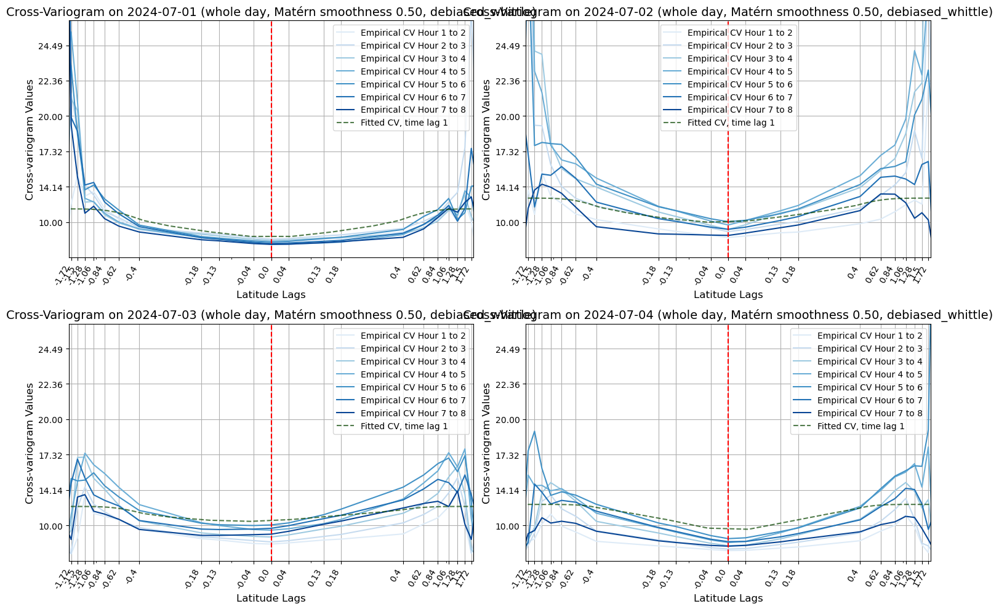

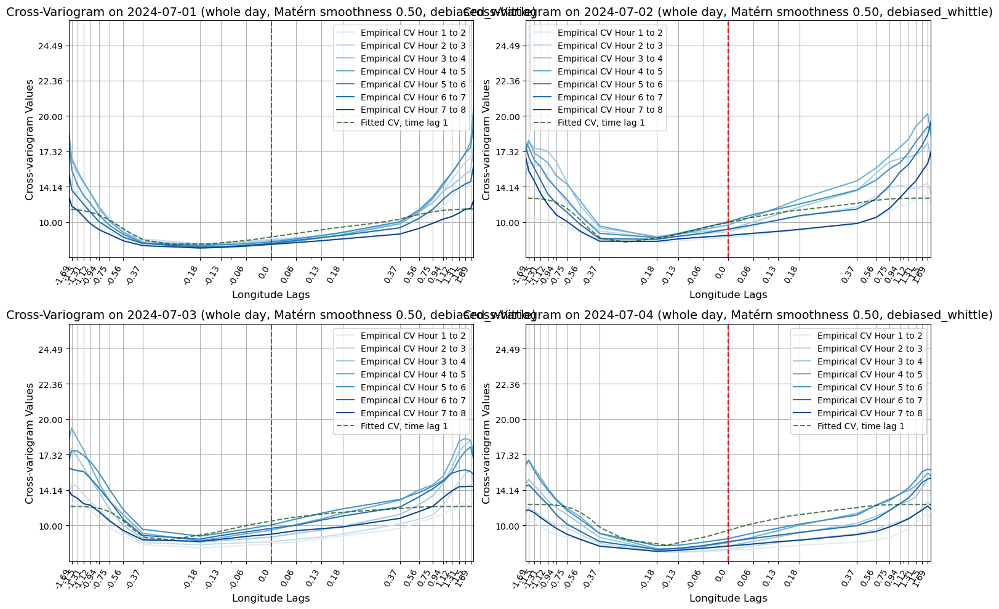

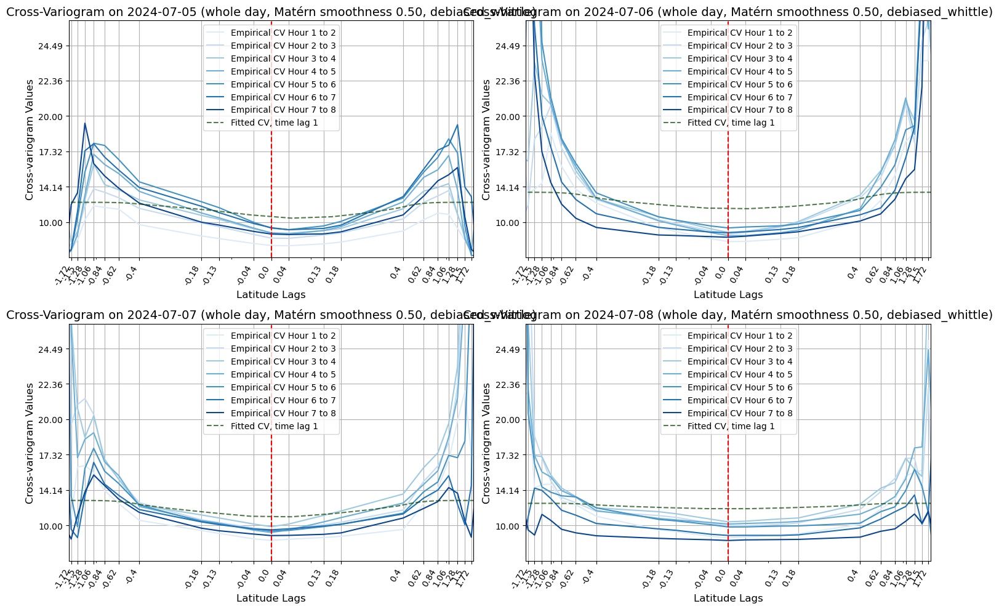

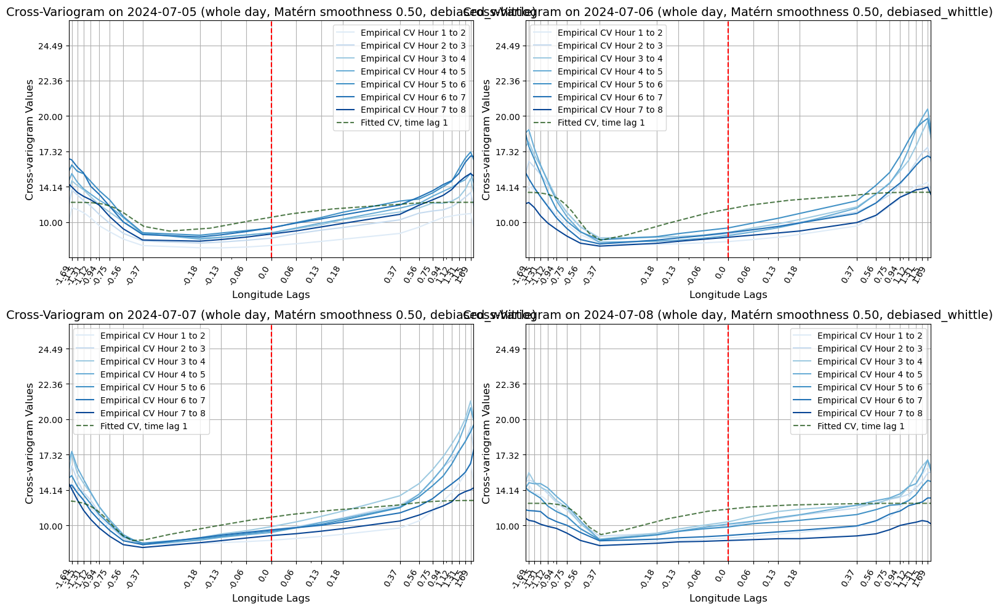

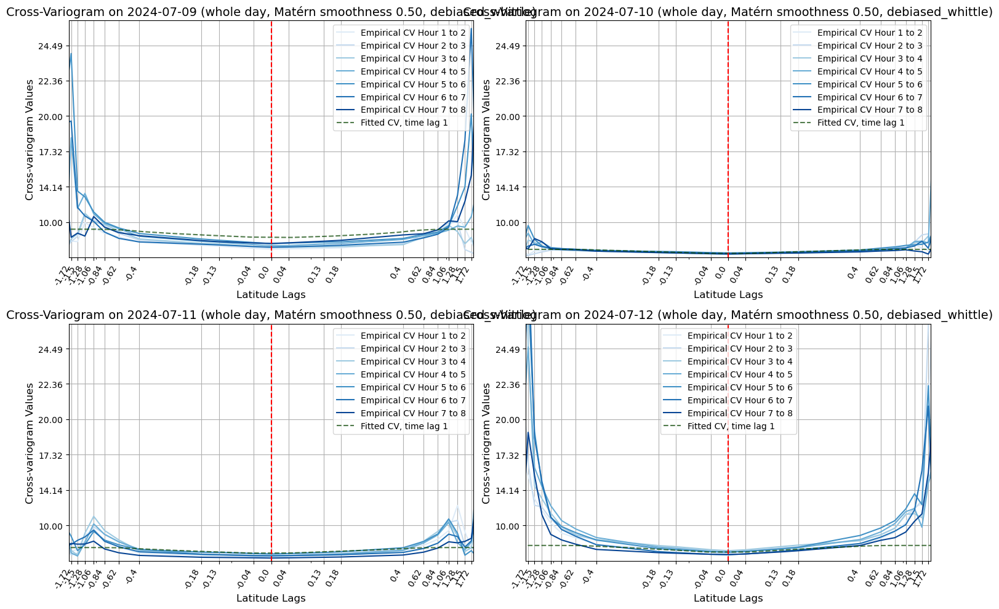

...

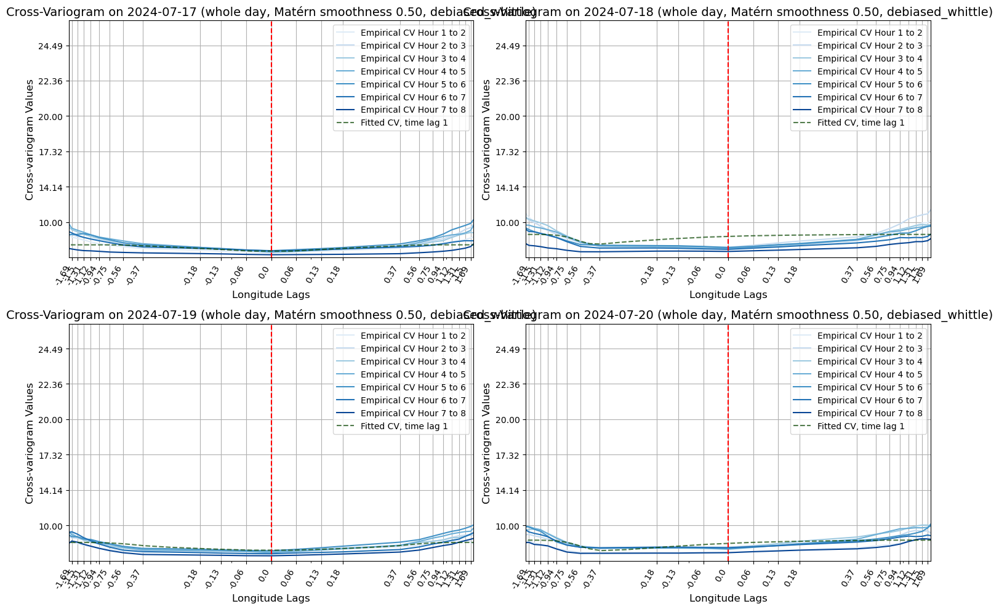

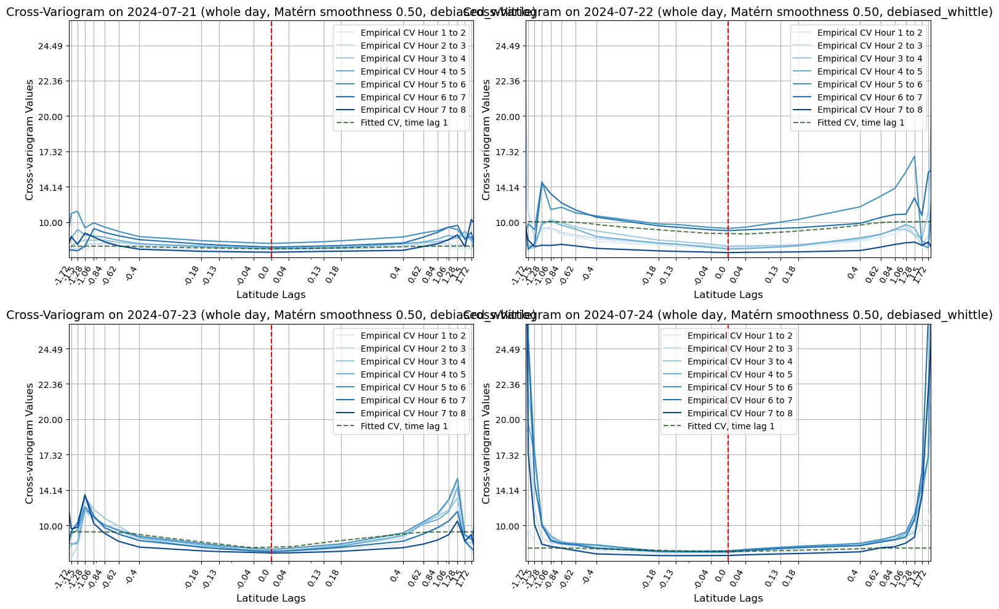

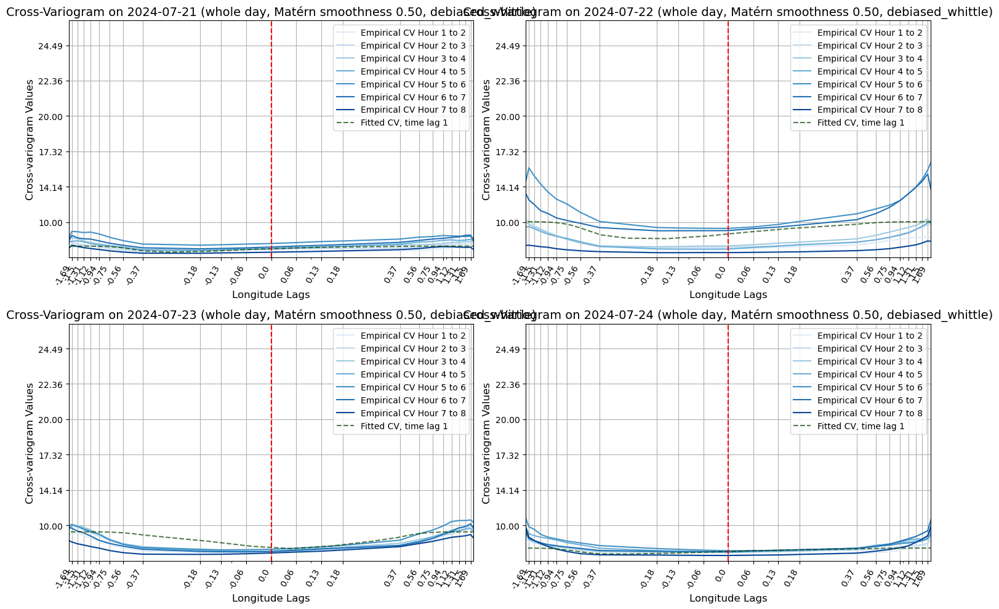

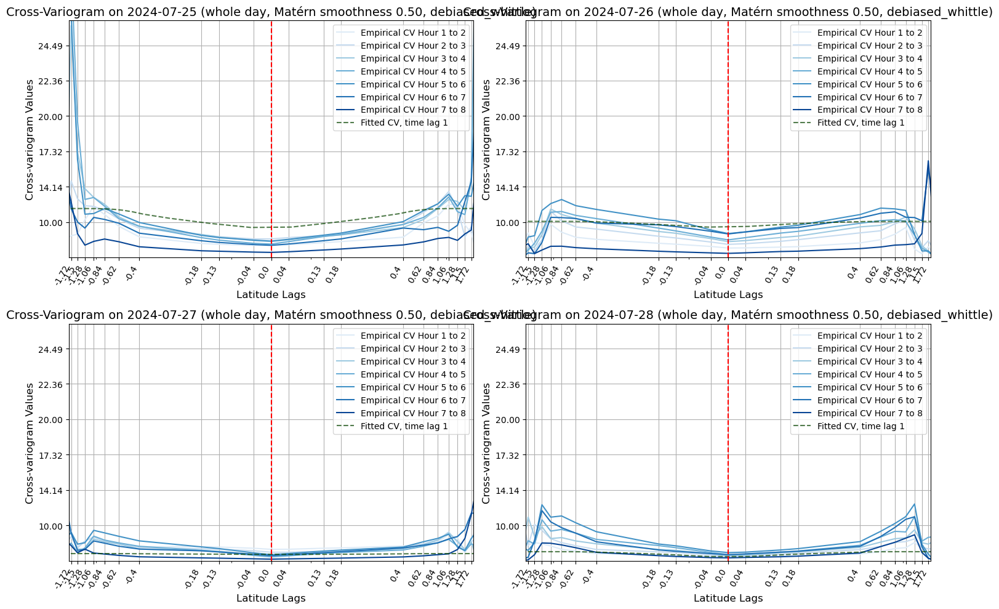

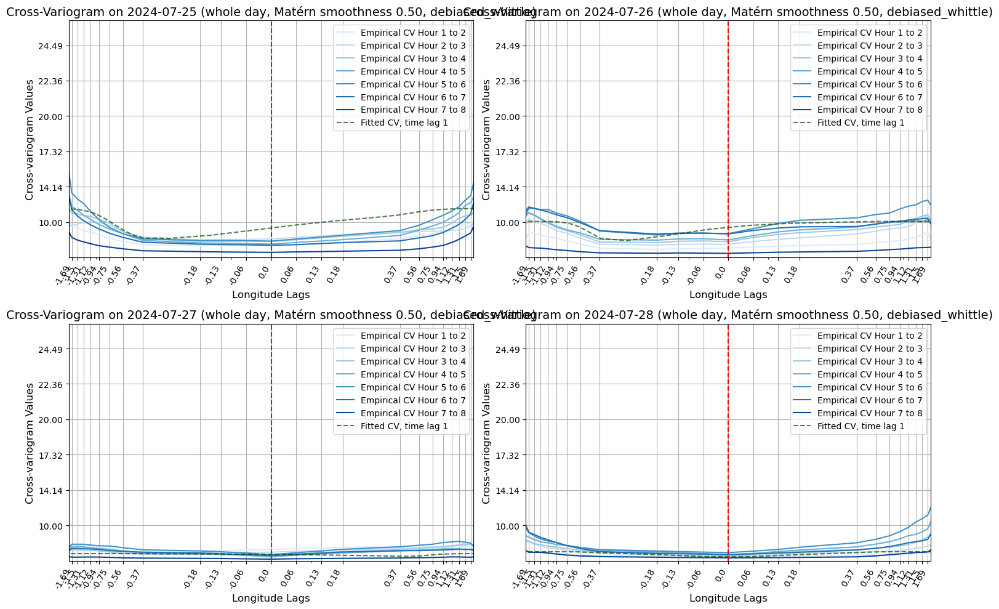

Wrote 14 Debiased Whittle figures to /Users/joonwonlee/Documents/GEMS_TCO-1/outputs/day/plots/empirical_fitted_cross_variograms/2024_07/debiased_whittle


In [8]:
dw_plots = plot_cross_variograms("debiased_whittle")
print(f"Wrote {len(dw_plots)} Debiased Whittle figures to {PLOT_ROOT / 'debiased_whittle'}")

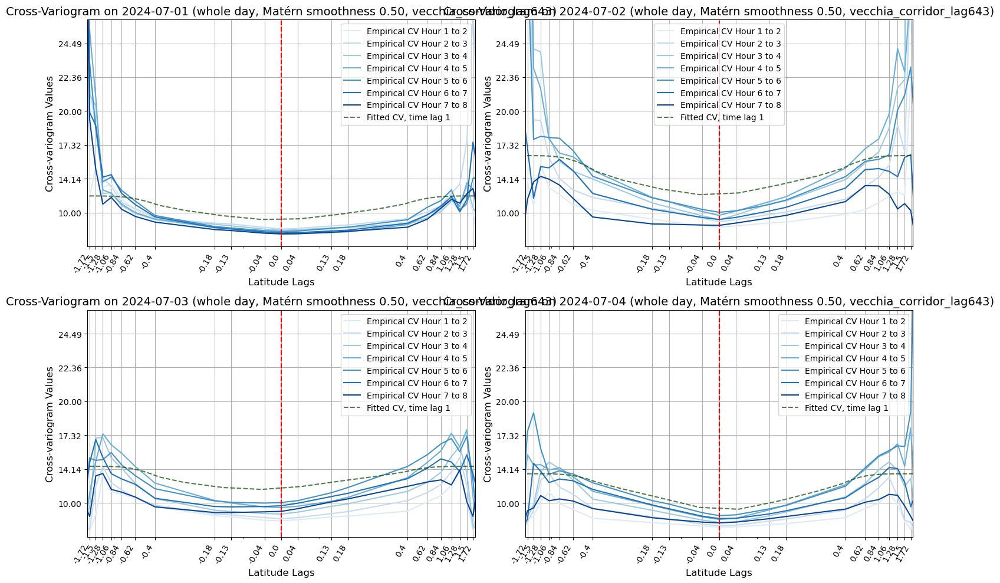

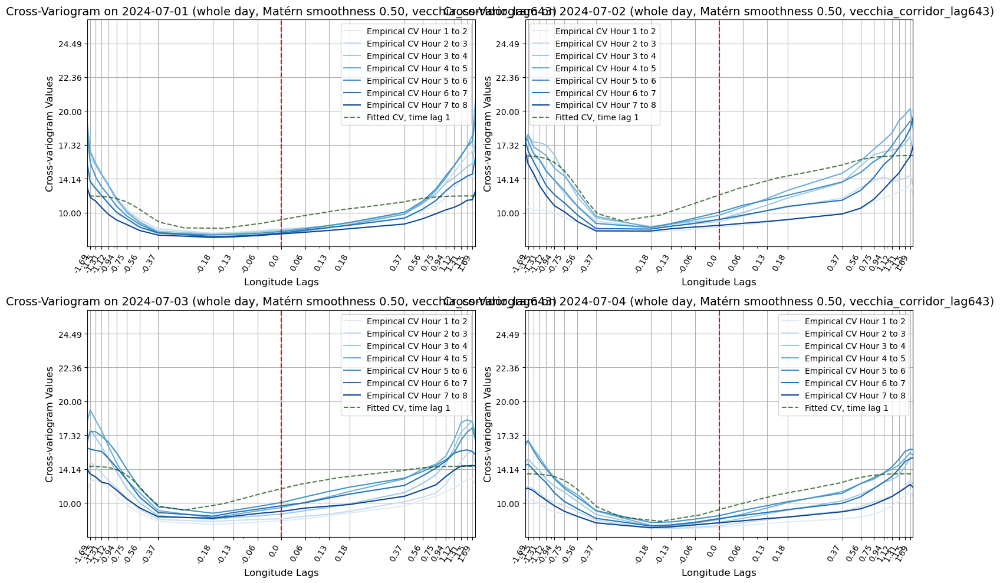

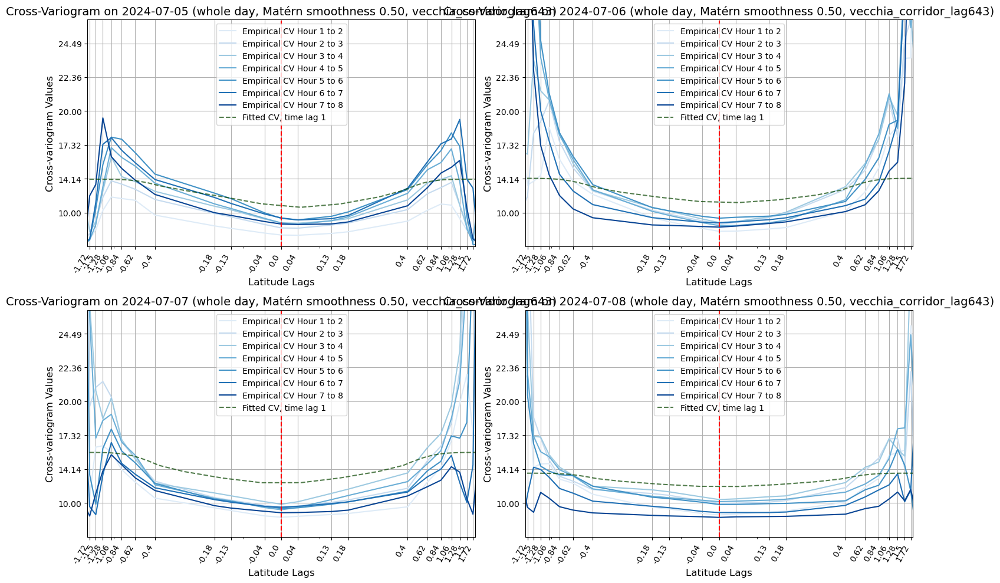

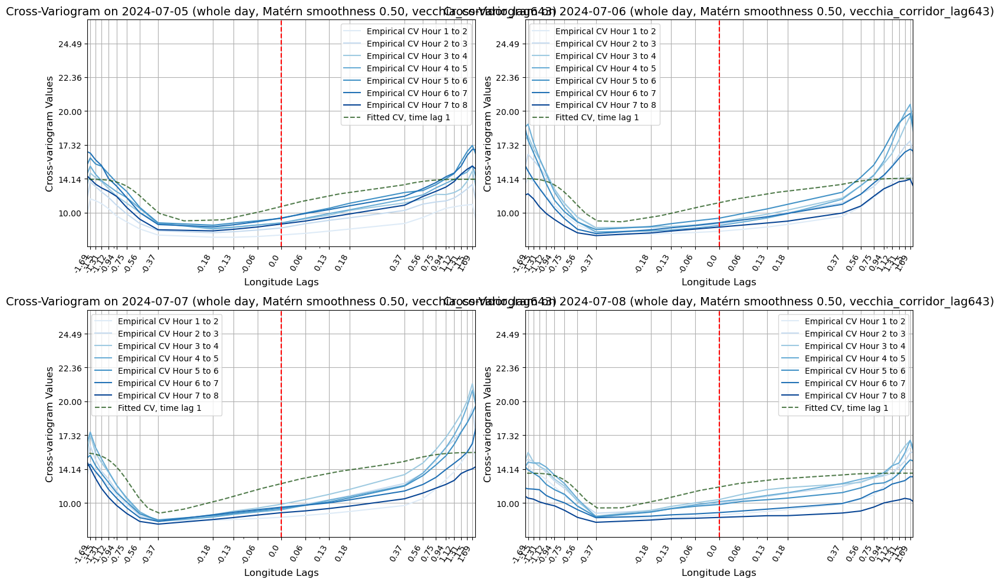

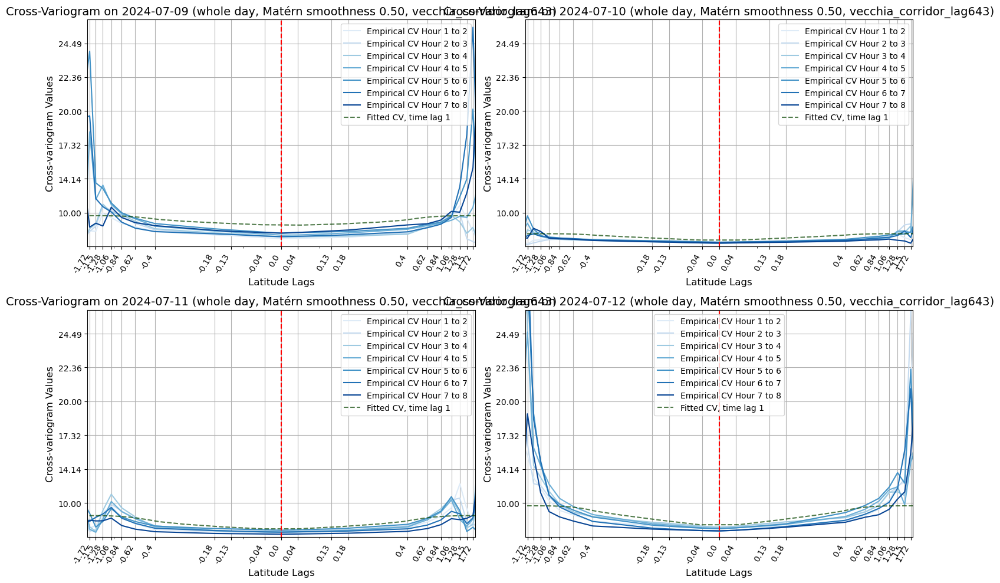

...

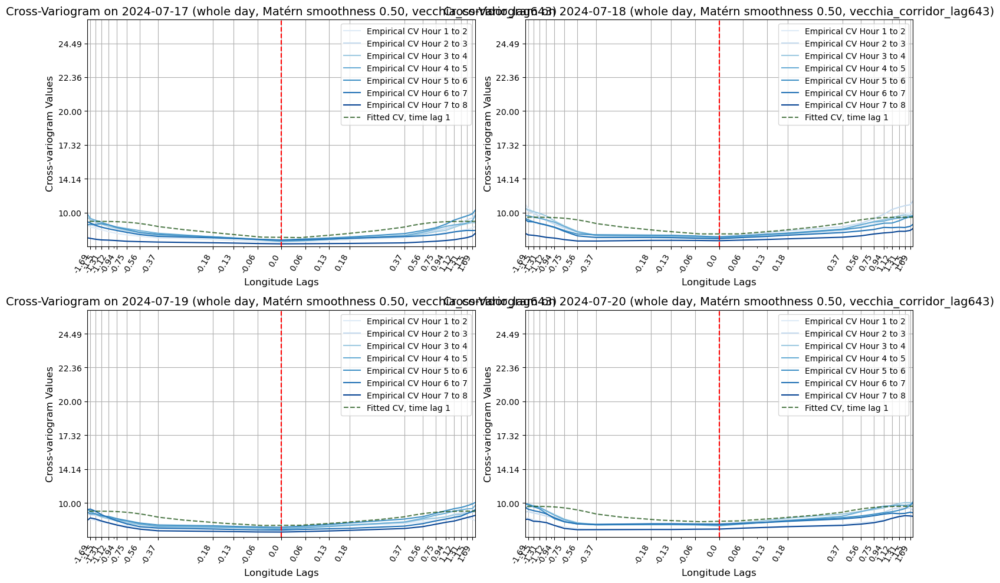

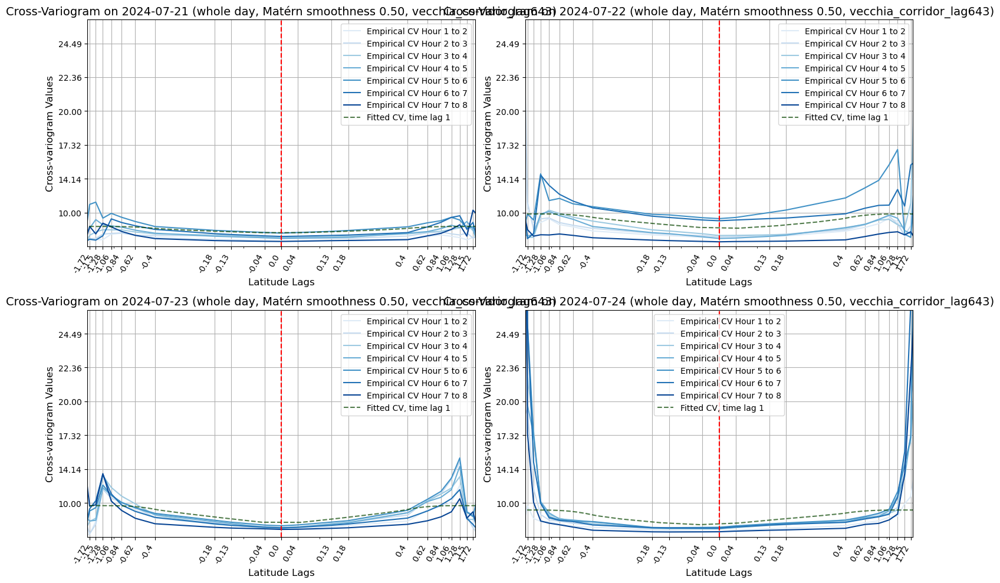

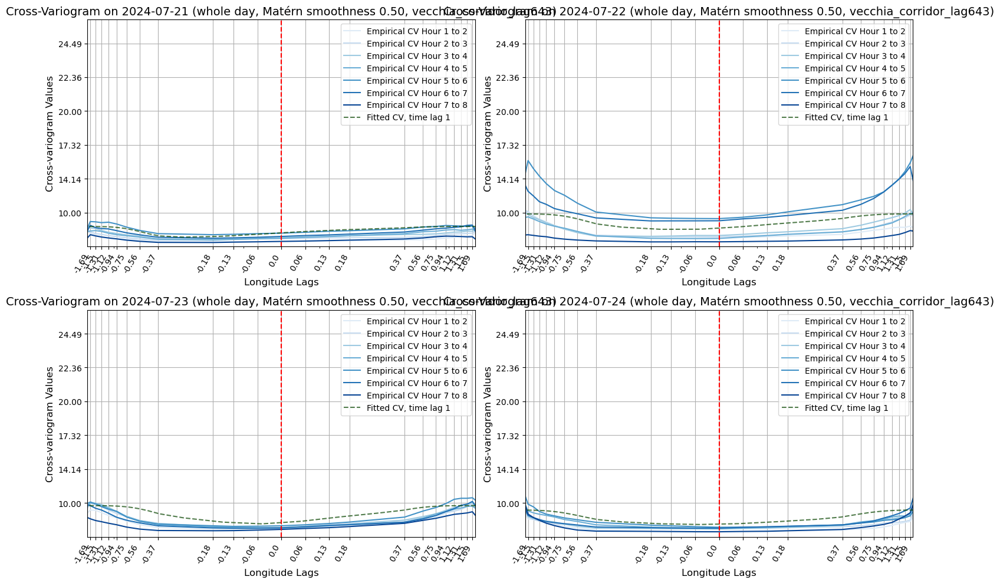

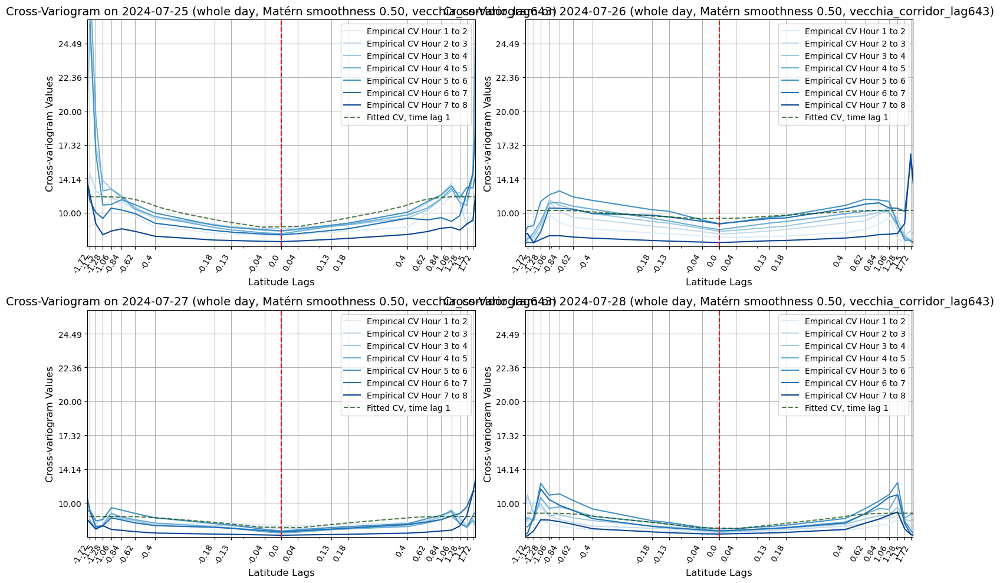

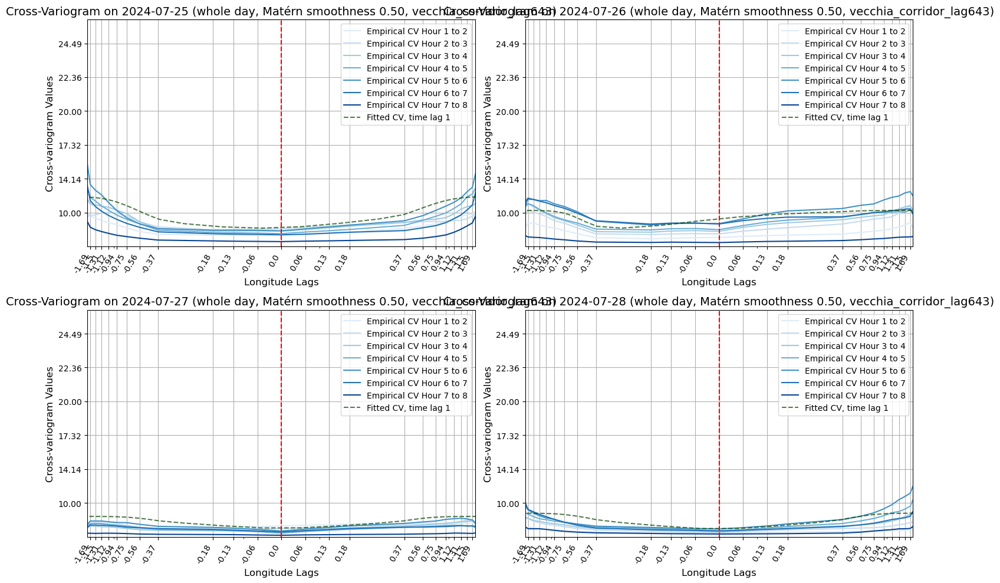

Wrote 14 corridor Vecchia figures to /Users/joonwonlee/Documents/GEMS_TCO-1/outputs/day/plots/empirical_fitted_cross_variograms/2024_07/vecchia_corridor_lag643


In [9]:
vecchia_plots = plot_cross_variograms("vecchia_corridor_lag643")
print(
    f"Wrote {len(vecchia_plots)} corridor Vecchia figures to "
    f"{PLOT_ROOT / 'vecchia_corridor_lag643'}"
)

## Scope and provenance

- Debiased Whittle parameters come from `real_dw_july_22_23_24_25.csv`.
- Vecchia parameters come from the current 4×4 grouped-batched corridor 6/4/3 results in `real_july_corridor_width_4x4_lag643_all_fits.csv`; only `status == 'ok'` and `smooth == 0.5` rows are eligible.
- Both tables are filtered to July 2025 and aligned to calendar days 1–28 before plotting.
- The former smoothness 1.0/1.5 and raw-data variance cells were removed from this notebook because they depended on deleted files, undefined variables, and retired loading APIs. They were historical scratch work rather than part of the active comparison.
- `research.diagnostics.evaluate` is intentionally outside the installed `GEMS_TCO` API. If this diagnostic becomes stable, it should be promoted as a tested module rather than reintroduced through package-level compatibility imports.